<div style='background-color: #f0f8ff; border: 3px solid Blue;'>
    <font size="+1" color="Blue">
        <b>🚀 Notebook de Treinamento YOLO para Detecção de Armas (com Augmentation)</b>
    </font>
</div>
<div style='background-color: #fff7f7; border: 2px solid Green;'>
    <font size="+1" color="Green">
        <b>✅ Dataset configurado: dataset_final</b>
    </font>
</div>

<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>1. Instalar bibliotecas e carregar modelo pré-treinado</b></font>
</div>

In [1]:
import os
import torch

# Verifica GPU
print("🔍 Verificando GPU...")
if torch.cuda.is_available():
    print(f"✅ GPU detectada: {torch.cuda.get_device_name(0)}")
    print(f"✅ CUDA Version: {torch.version.cuda}")
    device = 0
else:
    print("⚠️  GPU não disponível - usando CPU")
    device = "cpu"

from ultralytics import YOLO

# Carrega modelo pré-treinado
model = YOLO("yolo11n.pt")
print("✅ Modelo YOLO11n carregado com sucesso!")

🔍 Verificando GPU...
✅ GPU detectada: NVIDIA GeForce GTX 1060 6GB
✅ CUDA Version: 12.1
✅ Modelo YOLO11n carregado com sucesso!


<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>2. Configuração do Dataset</b></font>
</div>

In [2]:
import os

# Define o diretório base e caminhos do dataset
BASE_DIR = os.getcwd()
DATASET_DIR = os.path.join(BASE_DIR, "dataset_final")
DATASET_YAML = os.path.join(DATASET_DIR, "dataset.yaml")

print(f"📁 Diretório base: {BASE_DIR}")
print(f"📁 Dataset: {DATASET_DIR}")
print(f"📄 Dataset YAML: {DATASET_YAML}")

# Verifica se o dataset existe
if os.path.exists(DATASET_YAML):
    print("✅ Dataset encontrado!")
    
    # Conta arquivos
    train_path = os.path.join(DATASET_DIR, "train", "images")
    val_path = os.path.join(DATASET_DIR, "val", "images")
    test_path = os.path.join(DATASET_DIR, "test", "images")
    
    train_images = len([f for f in os.listdir(train_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]) if os.path.exists(train_path) else 0
    val_images = len([f for f in os.listdir(val_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]) if os.path.exists(val_path) else 0
    test_images = len([f for f in os.listdir(test_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]) if os.path.exists(test_path) else 0
    
    print(f"📊 Imagens de treino: {train_images}")
    print(f"📊 Imagens de validação: {val_images}")
    print(f"📊 Imagens de teste: {test_images}")
else:
    print("❌ Dataset não encontrado! Verifique o caminho.")

📁 Diretório base: D:\Desktop\Projetos\visao
📁 Dataset: D:\Desktop\Projetos\visao\dataset_final
📄 Dataset YAML: D:\Desktop\Projetos\visao\dataset_final\dataset.yaml
✅ Dataset encontrado!
📊 Imagens de treino: 15015
📊 Imagens de validação: 4290
📊 Imagens de teste: 2146


<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>3. Visualização dos Dados</b></font>
</div>

✅ Classes encontradas: ['Gun']
📈 Análise de dados train em processo...



C:\Users\lucas\AppData\Local\Temp\ipykernel_3300\863082479.py:132: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(cls_names)


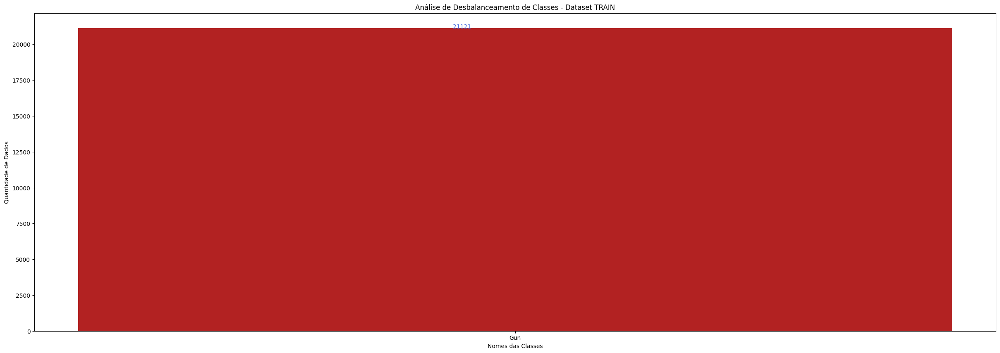

C:\Users\lucas\AppData\Local\Temp\ipykernel_3300\863082479.py:132: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(cls_names)


📈 Análise de dados val em processo...



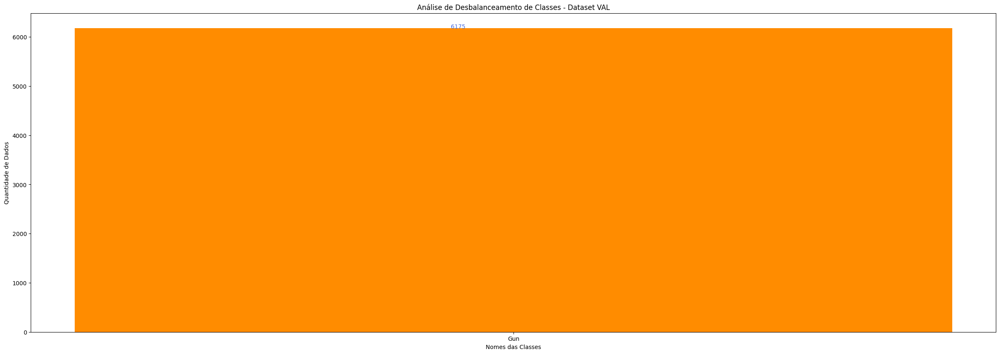

📈 Análise de dados test em processo...



C:\Users\lucas\AppData\Local\Temp\ipykernel_3300\863082479.py:132: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(cls_names)


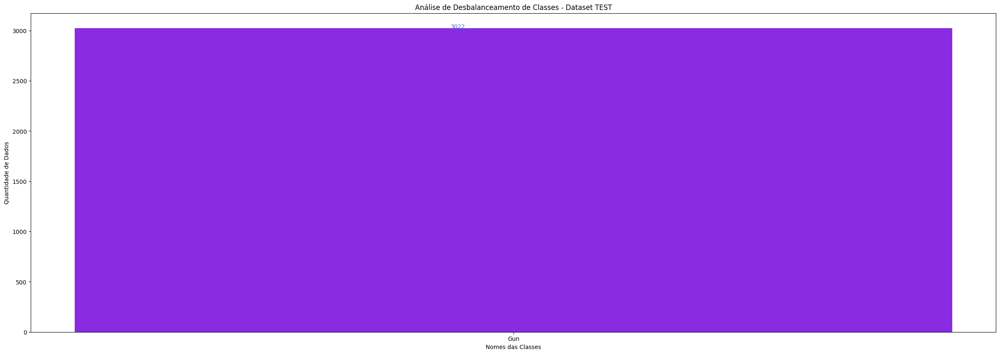

In [3]:
import cv2, yaml, random, numpy as np
from glob import glob
from PIL import Image
from matplotlib import pyplot as plt

class Visualizacao:

    def __init__(self, data_types, n_ims, rows, cmap = None):
        self.n_ims, self.rows = n_ims, rows
        self.cmap, self.data_types = cmap, data_types
        self.colors = ["firebrick", "darkorange", "blueviolet"]
        
        self.get_cls_names()
        self.get_bboxes()        
                
    def get_cls_names(self):
        # Lê o arquivo YAML do dataset
        with open(DATASET_YAML, 'r', encoding='utf-8') as file:
            data = yaml.safe_load(file)
        
        # Extrai nomes das classes
        class_names = data['names']
        
        # Cria dicionário com índice como chave e nome da classe como valor
        self.class_dict = {index: name for index, name in enumerate(class_names)}
        print(f"✅ Classes encontradas: {list(self.class_dict.values())}")
    
    def get_bboxes(self):
        self.vis_datas, self.analysis_datas, self.im_paths = {}, {}, {}
        
        for data_type in self.data_types:
            all_bboxes, all_analysis_datas = [], {}
            # Busca imagens no dataset
            im_paths = glob(os.path.join(DATASET_DIR, data_type, "images", "*"))
            im_paths = [p for p in im_paths if p.lower().endswith(('.jpg', '.jpeg', '.png'))]
            
            for idx, im_path in enumerate(im_paths):
                bboxes = []
                # Encontra o arquivo de label correspondente
                lbl_path = im_path.replace("images", "labels")
                for ext in ['.jpg', '.jpeg', '.JPG', '.JPEG', '.png', '.PNG']:
                    lbl_path = lbl_path.replace(ext, ".txt")
                
                if not os.path.isfile(lbl_path):
                    continue
                    
                meta_data = open(lbl_path, 'r').readlines()
                for data in meta_data:
                    # Divide a string por espaço e remove quebra de linha
                    parts = data.strip().split()[:5]
                    if len(parts) < 5:
                        continue
                    cls_name = self.class_dict[int(parts[0])]
                    # Converte primeiro elemento para inteiro e o resto para float
                    bboxes.append([cls_name] + [float(x) for x in parts[1:]])
                    if cls_name not in all_analysis_datas:
                        all_analysis_datas[cls_name] = 1
                    else:
                        all_analysis_datas[cls_name] += 1
                all_bboxes.append(bboxes)
                    
            self.vis_datas[data_type] = all_bboxes
            self.analysis_datas[data_type] = all_analysis_datas
            self.im_paths[data_type] = im_paths
    
    def plot(self, rows, cols, count, im_path, bboxes):
        plt.subplot(rows, cols, count)
        or_im = np.array(Image.open(im_path).convert("RGB"))
        height, width, _ = or_im.shape

        for bbox in bboxes:
            class_id, x_center, y_center, w, h = bbox

            # Converte formato YOLO para valores de pixel
            x_min = int((x_center - w / 2) * width)
            y_min = int((y_center - h / 2) * height)
            x_max = int((x_center + w / 2) * width)
            y_max = int((y_center + h / 2) * height)
            
            color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
            cv2.rectangle(img=or_im, pt1=(x_min, y_min), pt2=(x_max, y_max), color=color, thickness=3)
        
        plt.imshow(or_im)
        plt.axis("off")
        plt.title(f"Há {len(bboxes)} objeto(s) na imagem.")
        
        return count + 1

    def vis(self, save_name):
        print(f"📊 Visualização de dados {save_name.upper()} em processo...\n")
        assert self.cmap in ["rgb", "gray"], "Por favor escolha rgb ou gray cmap"
        if self.cmap == "rgb":
            cmap = "viridis"
        cols = self.n_ims // self.rows
        count = 1
        
        plt.figure(figsize=(25, 20))
        
        if len(self.vis_datas[save_name]) == 0:
            print(f"⚠️  Nenhuma imagem encontrada para {save_name}")
            return
            
        indices = [random.randint(a=0, b=len(self.vis_datas[save_name]) - 1) for _ in range(min(self.n_ims, len(self.vis_datas[save_name])))]

        for idx, index in enumerate(indices):
            if count == self.n_ims + 1:
                break
            
            im_path = self.im_paths[save_name][index]
            bboxes = self.vis_datas[save_name][index]

            count = self.plot(self.rows, cols, count, im_path=im_path, bboxes=bboxes)
            
        plt.show()

    def data_analysis(self, save_name, color):
        print(f"📈 Análise de dados {save_name} em processo...\n")
        
        if save_name not in self.analysis_datas or len(self.analysis_datas[save_name]) == 0:
            print(f"⚠️  Nenhum dado encontrado para {save_name}")
            return
        
        width, text_width, text_height = 0.7, 0.05, 2
        cls_names = list(self.analysis_datas[save_name].keys())
        counts = list(self.analysis_datas[save_name].values())
        
        _, ax = plt.subplots(figsize=(30, 10))
        indices = np.arange(len(counts))

        ax.bar(indices, counts, width, color=color)
        ax.set_xlabel("Nomes das Classes", color="black")
        ax.set_xticklabels(cls_names)
        ax.set(xticks=indices, xticklabels=cls_names)
        ax.set_ylabel("Quantidade de Dados", color="black")
        ax.set_title(f"Análise de Desbalanceamento de Classes - Dataset {save_name.upper()}")

        for i, v in enumerate(counts):
            ax.text(i - text_width, v + text_height, str(v), color="royalblue")
        plt.show()
    
    def visualization(self):
        [self.vis(save_name) for save_name in self.data_types]
        
    def analysis(self):
        [self.data_analysis(save_name, color) for (save_name, color) in zip(self.data_types, self.colors)]
        
# Cria visualização
vis = Visualizacao(data_types=["train", "val", "test"], n_ims=20, rows=5, cmap="rgb")
vis.analysis()

📊 Visualização de dados TRAIN em processo...



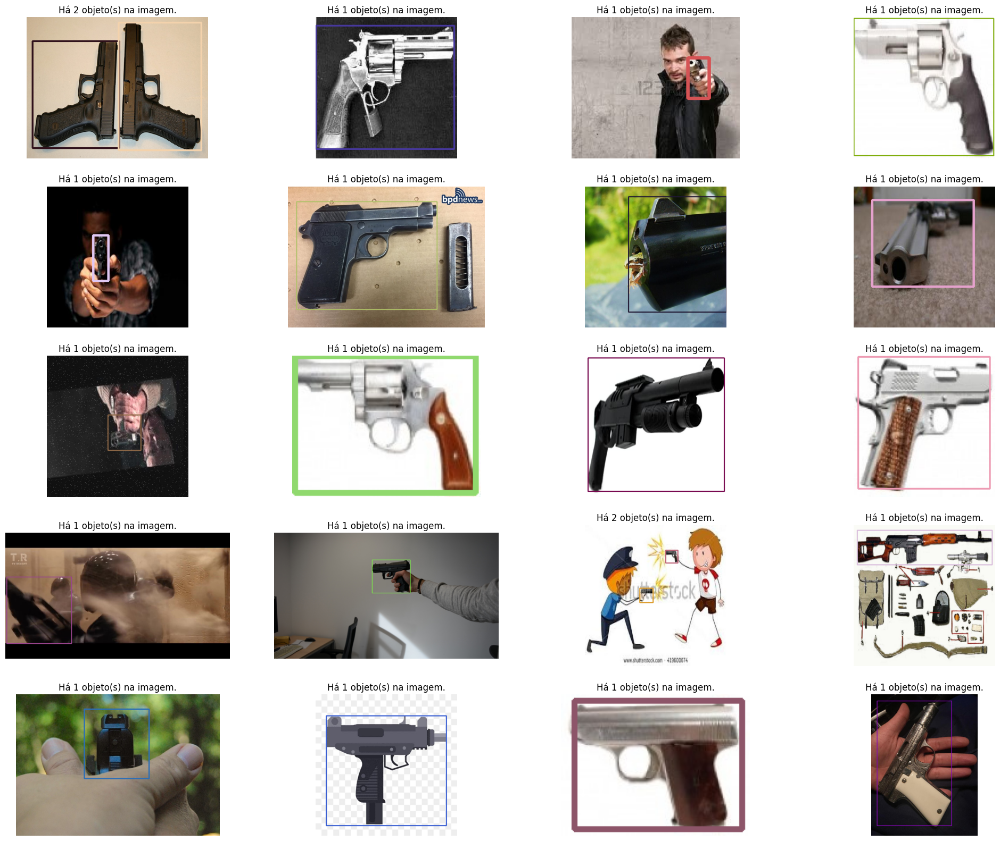

📊 Visualização de dados VAL em processo...



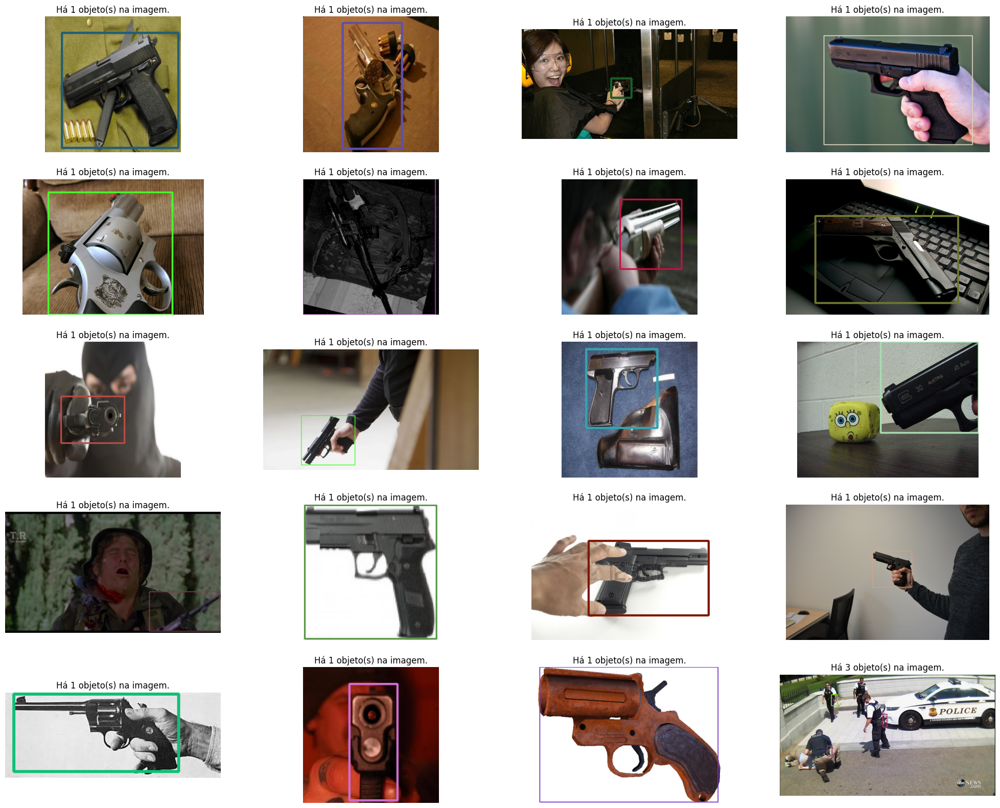

📊 Visualização de dados TEST em processo...



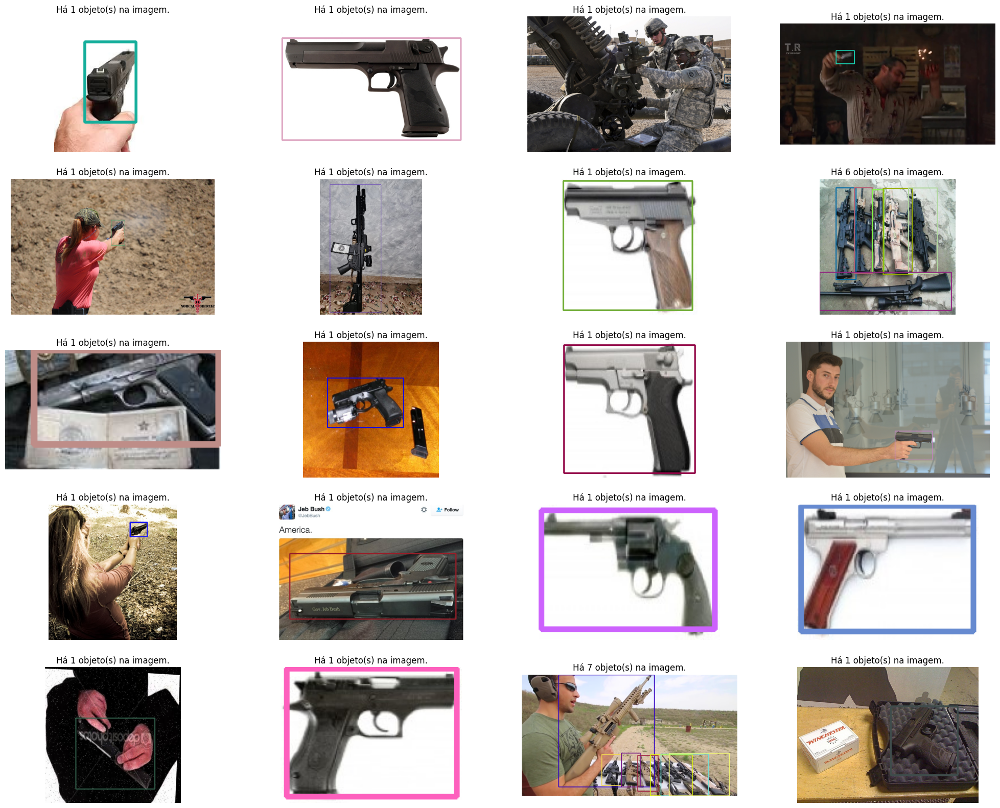

In [4]:
# Visualiza imagens com bounding boxes
vis.visualization()

<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>3.5. Verificação de Augmentation</b></font>
</div>


🔍 Verificando se as augmentations estão funcionando...
📄 Configurações carregadas de: augmentation.yaml

📸 Visualizando 6 exemplos de augmentation...



C:\Users\lucas\AppData\Local\Temp\ipykernel_3300\113680444.py:128: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\lucas\AppData\Local\Programs\Python\Python312\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


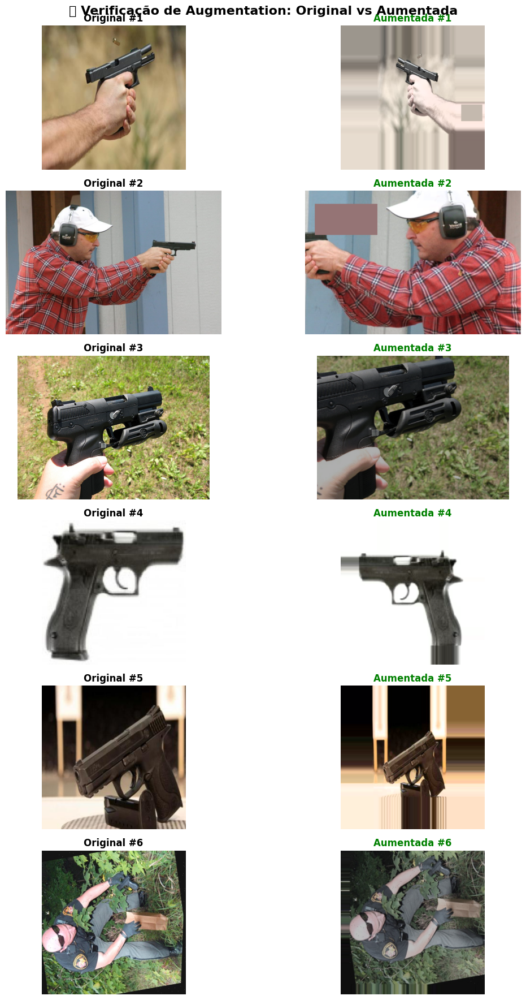


✅ Visualização concluída!
💡 Compare as imagens originais (esquerda) com as aumentadas (direita)
💡 Se você ver diferenças (flip, cores, translação, etc.), a augmentation está funcionando!

📊 Configurações ativas:
   • Flip horizontal: 0.5
   • HSV (H/S/V): 0.015/0.7/0.4
   • Mosaic: 1.0 (aplicado durante treinamento)
   • Erasing: 0.4
   • Translate: 0.1
   • Scale: 0.5

💡 Nota: Mosaic combina 4 imagens, então não aparece nesta visualização individual.
💡 Durante o treinamento, você verá exemplos de mosaic nos batches de treino.


In [6]:
import yaml
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from glob import glob
import random
import cv2

# Carrega configurações de augmentation
AUGMENTATION_YAML = "augmentation.yaml"
with open(AUGMENTATION_YAML, 'r', encoding='utf-8') as f:
    augmentation_config = yaml.safe_load(f)

print("🔍 Verificando se as augmentations estão funcionando...")
print(f"📄 Configurações carregadas de: {AUGMENTATION_YAML}\n")

# Seleciona algumas imagens aleatórias para visualizar
n_samples = 6
print(f"📸 Visualizando {n_samples} exemplos de augmentation...\n")

# Pega imagens do dataset
train_images_path = os.path.join(DATASET_DIR, "train", "images")
all_images = glob(os.path.join(train_images_path, "*.jpg")) + \
             glob(os.path.join(train_images_path, "*.png")) + \
             glob(os.path.join(train_images_path, "*.jpeg"))

if len(all_images) == 0:
    print("⚠️  Nenhuma imagem encontrada no dataset de treino!")
else:
    # Seleciona imagens aleatórias
    sample_images = random.sample(all_images, min(n_samples, len(all_images)))
    
    # Cria figura para visualização
    fig, axes = plt.subplots(n_samples, 2, figsize=(12, 3*n_samples))
    fig.suptitle('🔍 Verificação de Augmentation: Original vs Aumentada', 
                 fontsize=16, fontweight='bold')
    
    for idx, img_path in enumerate(sample_images):
        # Carrega imagem original
        original_img = np.array(Image.open(img_path).convert('RGB'))
        augmented_img = original_img.copy()
        
        # Aplica augmentations baseadas nas configurações do YAML
        # Flip horizontal (se configurado)
        if augmentation_config.get('fliplr', 0) > 0 and random.random() < augmentation_config['fliplr']:
            augmented_img = np.fliplr(augmented_img)
        
        # Ajuste HSV (Hue, Saturation, Value)
        if (augmentation_config.get('hsv_h', 0) > 0 or 
            augmentation_config.get('hsv_s', 0) > 0 or 
            augmentation_config.get('hsv_v', 0) > 0):
            hsv = cv2.cvtColor(augmented_img, cv2.COLOR_RGB2HSV).astype(np.float32)
            
            # Hue adjustment
            if augmentation_config.get('hsv_h', 0) > 0:
                h_shift = random.uniform(-augmentation_config['hsv_h']*179, 
                                        augmentation_config['hsv_h']*179)
                hsv[:, :, 0] = np.clip(hsv[:, :, 0] + h_shift, 0, 179)
            
            # Saturation adjustment
            if augmentation_config.get('hsv_s', 0) > 0:
                s_factor = random.uniform(1 - augmentation_config['hsv_s'], 
                                        1 + augmentation_config['hsv_s'])
                hsv[:, :, 1] = np.clip(hsv[:, :, 1] * s_factor, 0, 255)
            
            # Value (brightness) adjustment
            if augmentation_config.get('hsv_v', 0) > 0:
                v_factor = random.uniform(1 - augmentation_config['hsv_v'], 
                                        1 + augmentation_config['hsv_v'])
                hsv[:, :, 2] = np.clip(hsv[:, :, 2] * v_factor, 0, 255)
            
            augmented_img = cv2.cvtColor(hsv.astype(np.uint8), cv2.COLOR_HSV2RGB)
        
        # Translate (translação) - move a imagem
        if augmentation_config.get('translate', 0) > 0:
            h, w = augmented_img.shape[:2]
            tx = random.uniform(-augmentation_config['translate']*w, 
                               augmentation_config['translate']*w)
            ty = random.uniform(-augmentation_config['translate']*h, 
                               augmentation_config['translate']*h)
            M = np.float32([[1, 0, tx], [0, 1, ty]])
            augmented_img = cv2.warpAffine(augmented_img, M, (w, h), 
                                          borderMode=cv2.BORDER_REPLICATE)
        
        # Scale (escala) - redimensiona a imagem
        if augmentation_config.get('scale', 0) > 0:
            scale_factor = random.uniform(1 - augmentation_config['scale'], 
                                       1 + augmentation_config['scale'])
            h, w = augmented_img.shape[:2]
            new_h, new_w = int(h * scale_factor), int(w * scale_factor)
            augmented_img = cv2.resize(augmented_img, (new_w, new_h))
            # Crop ou pad para manter o tamanho original
            if scale_factor > 1:
                # Crop center
                start_y = (new_h - h) // 2
                start_x = (new_w - w) // 2
                augmented_img = augmented_img[start_y:start_y+h, start_x:start_x+w]
            else:
                # Pad
                pad_y = (h - new_h) // 2
                pad_x = (w - new_w) // 2
                augmented_img = cv2.copyMakeBorder(augmented_img, pad_y, h-new_h-pad_y,
                                                  pad_x, w-new_w-pad_x,
                                                  cv2.BORDER_REPLICATE)
        
        # Random Erasing (apaga partes aleatórias)
        if augmentation_config.get('erasing', 0) > 0 and random.random() < augmentation_config['erasing']:
            h, w = augmented_img.shape[:2]
            # Cria uma região aleatória para apagar
            erase_h = random.randint(int(h*0.1), int(h*0.3))
            erase_w = random.randint(int(w*0.1), int(w*0.3))
            erase_y = random.randint(0, h - erase_h)
            erase_x = random.randint(0, w - erase_w)
            # Preenche com valor aleatório ou média da imagem
            mean_color = augmented_img.mean(axis=(0, 1))
            augmented_img[erase_y:erase_y+erase_h, erase_x:erase_x+erase_w] = mean_color
        
        # Mostra imagem original
        axes[idx, 0].imshow(original_img)
        axes[idx, 0].set_title(f'Original #{idx+1}', fontweight='bold')
        axes[idx, 0].axis('off')
        
        # Mostra imagem aumentada
        axes[idx, 1].imshow(augmented_img)
        axes[idx, 1].set_title(f'Aumentada #{idx+1}', fontweight='bold', color='green')
        axes[idx, 1].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print("\n✅ Visualização concluída!")
    print("💡 Compare as imagens originais (esquerda) com as aumentadas (direita)")
    print("💡 Se você ver diferenças (flip, cores, translação, etc.), a augmentation está funcionando!")
    print(f"\n📊 Configurações ativas:")
    print(f"   • Flip horizontal: {augmentation_config.get('fliplr', 0)}")
    print(f"   • HSV (H/S/V): {augmentation_config.get('hsv_h', 0)}/{augmentation_config.get('hsv_s', 0)}/{augmentation_config.get('hsv_v', 0)}")
    print(f"   • Mosaic: {augmentation_config.get('mosaic', 0)} (aplicado durante treinamento)")
    print(f"   • Erasing: {augmentation_config.get('erasing', 0)}")
    print(f"   • Translate: {augmentation_config.get('translate', 0)}")
    print(f"   • Scale: {augmentation_config.get('scale', 0)}")
    print("\n💡 Nota: Mosaic combina 4 imagens, então não aparece nesta visualização individual.")
    print("💡 Durante o treinamento, você verá exemplos de mosaic nos batches de treino.")


<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>4. Treinamento do Modelo</b></font>
</div>

## 

In [7]:
import time
import yaml
from datetime import datetime

# Carrega configurações de augmentation do arquivo YAML
AUGMENTATION_YAML = "augmentation.yaml"
with open(AUGMENTATION_YAML, 'r', encoding='utf-8') as f:
    augmentation_config = yaml.safe_load(f)

# Registra tempo de início
start_time = time.time()
print(f"🚀 Iniciando treinamento às {datetime.now().strftime('%H:%M:%S')}")
if device == 0:
    print("🚀 Usando GPU - treinamento será muito mais rápido!")
else:
    print("⚠️  Usando CPU - treinamento será MUITO lento!")

print(f"\n📄 Carregando configurações de augmentation de: {AUGMENTATION_YAML}")
print("\n📊 Configurações de Augmentation aplicadas:")
print(f"   ✅ augment: {augmentation_config['augment']} (baixa quantidade de dados)")
print(f"   ✅ hsv_h: {augmentation_config['hsv_h']} (HSV hue augmentation)")
print(f"   ✅ hsv_s: {augmentation_config['hsv_s']} (HSV saturation augmentation)")
print(f"   ✅ hsv_v: {augmentation_config['hsv_v']} (HSV value augmentation)")
print(f"   ✅ translate: {augmentation_config['translate']} (Image translation)")
print(f"   ✅ scale: {augmentation_config['scale']} (Image scale)")
print(f"   ✅ fliplr: {augmentation_config['fliplr']} (Flip image left-right)")
print(f"   ✅ mosaic: {augmentation_config['mosaic']} (Mosaic augmentation)")
print(f"   ✅ erasing: {augmentation_config['erasing']} (Random erasing - dataset pequeno)")
if 'crop_fraction' in augmentation_config:
    print(f"   ✅ crop_fraction: {augmentation_config['crop_fraction']} (Onde o objeto aparece parcialmente)")

# Treina o modelo com augmentations do arquivo YAML
train_results = model.train(
    data=DATASET_YAML,  # caminho para o dataset YAML
    epochs=100,
    imgsz=480,
    device=device,
    # Augmentations carregadas do arquivo YAML
    **augmentation_config
)

# Calcula tempo total
end_time = time.time()
total_time = end_time - start_time
hours = int(total_time // 3600)
minutes = int((total_time % 3600) // 60)
seconds = int(total_time % 60)
print(f"\n✅ Treinamento concluído em {hours}h {minutes}m {seconds}s")

🚀 Iniciando treinamento às 16:34:07
🚀 Usando GPU - treinamento será muito mais rápido!

📄 Carregando configurações de augmentation de: augmentation.yaml

📊 Configurações de Augmentation aplicadas:
   ✅ augment: True (baixa quantidade de dados)
   ✅ hsv_h: 0.015 (HSV hue augmentation)
   ✅ hsv_s: 0.7 (HSV saturation augmentation)
   ✅ hsv_v: 0.4 (HSV value augmentation)
   ✅ translate: 0.1 (Image translation)
   ✅ scale: 0.5 (Image scale)
   ✅ fliplr: 0.5 (Flip image left-right)
   ✅ mosaic: 1.0 (Mosaic augmentation)
   ✅ erasing: 0.4 (Random erasing - dataset pequeno)
   ✅ crop_fraction: 0.8 (Onde o objeto aparece parcialmente)
New https://pypi.org/project/ultralytics/8.3.231 available  Update with 'pip install -U ultralytics'
WARNING 'crop_fraction' is deprecated and will be removed in the future.
Ultralytics 8.3.228  Python-3.12.10 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce GTX 1060 6GB, 6144MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batc

<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>5. Curvas de Aprendizado</b></font>
</div>

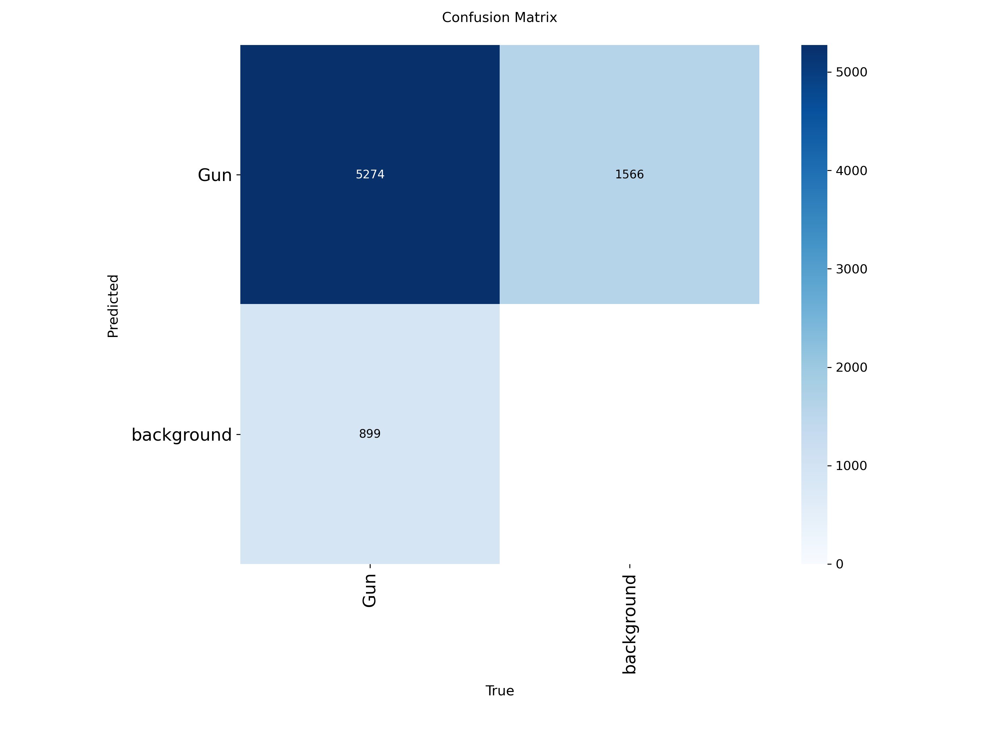

In [8]:
# Matriz de Confusão
from PIL import Image

# Encontra o diretório de treinamento mais recente
runs_dir = "runs/detect"
if os.path.exists(runs_dir):
    train_dirs = [d for d in os.listdir(runs_dir) if d.startswith("train")]
    if train_dirs:
        latest_train = sorted(train_dirs)[-1]
        confusion_path = os.path.join(runs_dir, latest_train, "confusion_matrix.png")
        if os.path.exists(confusion_path):
            display(Image.open(confusion_path))
        else:
            print(f"⚠️  Arquivo não encontrado: {confusion_path}")
    else:
        print("⚠️  Nenhum diretório de treinamento encontrado")
else:
    print("⚠️  Diretório runs/detect não encontrado. Execute o treinamento primeiro.")

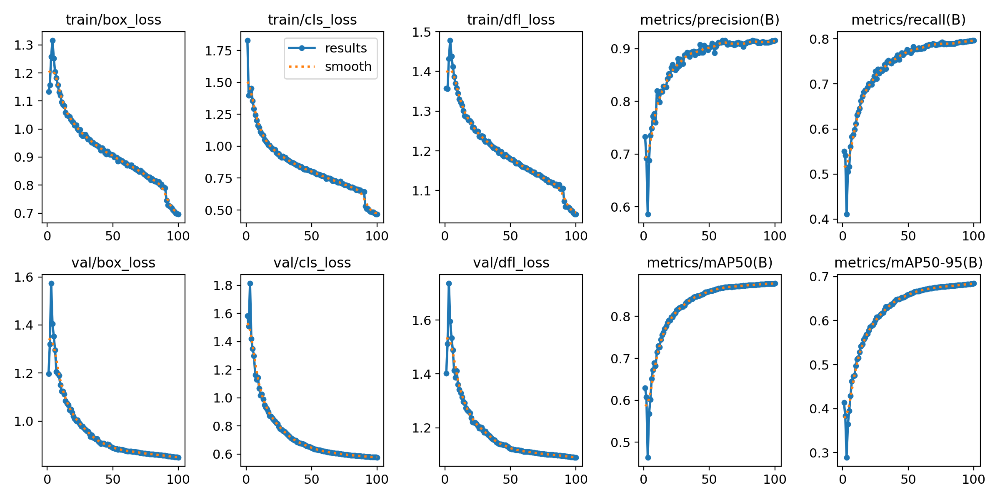

In [9]:
# Gráfico de Resultados (Losses e Métricas)
if os.path.exists(runs_dir):
    train_dirs = [d for d in os.listdir(runs_dir) if d.startswith("train")]
    if train_dirs:
        latest_train = sorted(train_dirs)[-1]
        results_path = os.path.join(runs_dir, latest_train, "results.png")
        if os.path.exists(results_path):
            display(Image.open(results_path))
        else:
            print(f"⚠️  Arquivo não encontrado: {results_path}")

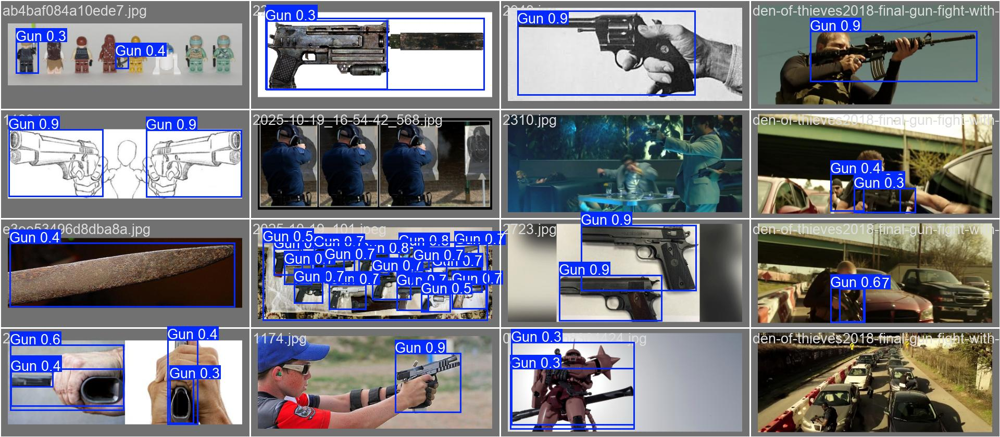

In [10]:
# Visualização de Predições na Validação
if os.path.exists(runs_dir):
    train_dirs = [d for d in os.listdir(runs_dir) if d.startswith("train")]
    if train_dirs:
        latest_train = sorted(train_dirs)[-1]
        val_pred_path = os.path.join(runs_dir, latest_train, "val_batch0_pred.jpg")
        if os.path.exists(val_pred_path):
            display(Image.open(val_pred_path))
        else:
            print(f"⚠️  Arquivo não encontrado: {val_pred_path}")

<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>6. Inferência com Dataset de Teste</b></font>
</div>

In [11]:
# Carrega o melhor modelo treinado
runs_dir = "runs/detect"
if os.path.exists(runs_dir):
    train_dirs = [d for d in os.listdir(runs_dir) if d.startswith("train")]
    if train_dirs:
        latest_train = sorted(train_dirs)[-1]
        best_model_path = os.path.join(runs_dir, latest_train, "weights", "best.pt")
        if os.path.exists(best_model_path):
            print(f"✅ Carregando melhor modelo: {best_model_path}")
            best_model = YOLO(best_model_path)
        else:
            print("⚠️  Melhor modelo não encontrado, usando modelo atual")
            best_model = model
    else:
        best_model = model
else:
    best_model = model

# Executa inferência no dataset de teste
test_images_path = os.path.join(DATASET_DIR, "test", "images")
print(f"🔍 Executando inferência em: {test_images_path}")

inference_results = best_model(test_images_path, device=device)
print(f"✅ Inferência concluída em {len(inference_results)} imagens")

✅ Carregando melhor modelo: runs/detect\train8\weights\best.pt
🔍 Executando inferência em: D:\Desktop\Projetos\visao\dataset_final\test\images

WARNING 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/2146 D:\Desktop\Projetos\visao\dataset_final\test\images\00020.jpg: 480x480 2 Guns, 12.1ms
image 2/2146 D:\Desktop\Projetos\visao\dataset_final\test\images\00024.jpg: 480x480 1 Gun, 16.9ms
image 3/2146 D:\Desktop\Projetos\visao\dataset_final\test\images\0003.jpg: 480x480 1 Gun, 12.8ms
image 4/2146 D:\Deskto

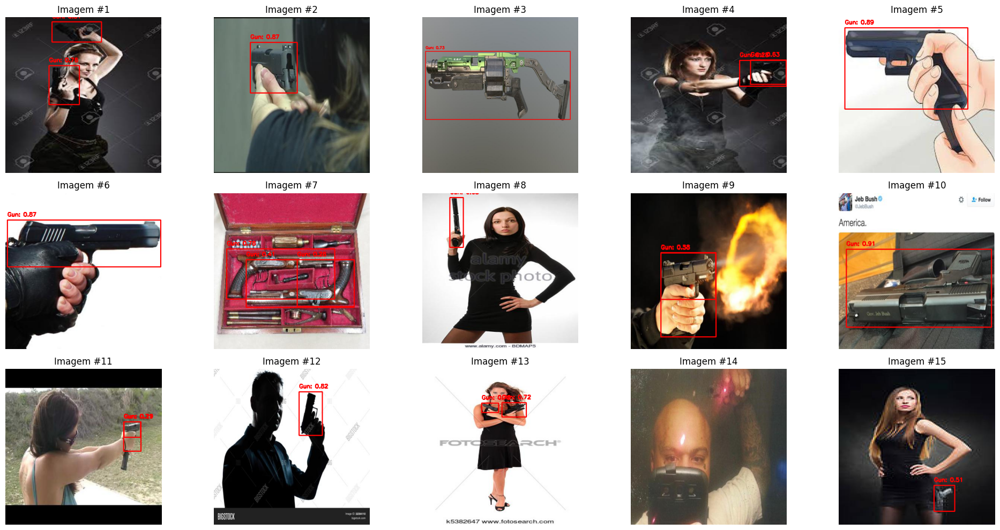

In [12]:
def visualizar_inferencia(res, n_ims, rows):
    """Visualiza resultados da inferência"""
    cols = n_ims // rows
    plt.figure(figsize=(20, 10))
    
    for idx, r in enumerate(res):
        if idx >= n_ims:
            break
        plt.subplot(rows, cols, idx + 1)
        or_im_rgb = np.array(Image.open(r.path).convert("RGB"))
        
        # Desenha bounding boxes
        for i in r:
            for bbox in i.boxes:
                box = bbox.xyxy[0]
                x1, y1, x2, y2 = box
                coord1, coord2 = (int(x1), int(y1)), (int(x2), int(y2))
                conf = bbox.conf[0]
                cls = int(bbox.cls[0])
                
                # Desenha retângulo
                cv2.rectangle(or_im_rgb, coord1, coord2, color=(255, 0, 0), thickness=2)
                
                # Adiciona label com confiança
                label = f"{best_model.names[cls]}: {conf:.2f}"
                cv2.putText(or_im_rgb, label, (int(x1), int(y1) - 10),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
        
        plt.imshow(or_im_rgb)
        plt.title(f"Imagem #{idx + 1}")
        plt.axis("off")
    
    plt.tight_layout()
    plt.show()

# Visualiza resultados
visualizar_inferencia(res=inference_results, n_ims=15, rows=3)

In [15]:
# Define o caminho do dataset
base_dir = os.getcwd()
dataset_yaml = os.path.join(base_dir, "dataset_final", "dataset.yaml")

val_metrics = model.val(
    data=dataset_yaml,
    split='test'
)
val_metrics.summary()

Ultralytics 8.3.228  Python-3.12.10 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce GTX 1060 6GB, 6144MiB)
val: Fast image access  (ping: 0.10.0 ms, read: 350.8328.9 MB/s, size: 113.2 KB)
val: Scanning D:\Desktop\Projetos\visao\dataset_final\test\labels.cache... 2146 images, 1 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 2146/2146  0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 135/135 6.6it/s 20.4s0.1s
                   all       2146       3022      0.916       0.81      0.887      0.689
Speed: 0.6ms preprocess, 3.6ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to D:\Desktop\Projetos\visao\runs\detect\val5


[{'Class': 'Gun',
  'Images': np.int64(2145),
  'Instances': np.int64(3022),
  'Box-P': np.float64(0.91573),
  'Box-R': np.float64(0.80973),
  'Box-F1': np.float64(0.85947),
  'mAP50': np.float64(0.8874),
  'mAP50-95': np.float64(0.68861)}]